<a href="https://colab.research.google.com/github/aupe/dl_cv_animals10/blob/master/dl_cv_animals10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Animals-10

Dataset is taken from https://www.kaggle.com/alessiocorrado99/animals10.
It contains about 28K medium quality animal images belonging to 10 categories: dog, cat, horse, spyder, butterfly, cicken, sheep, cow, squirrel, elephant. Original names are in Italian.

All the images have been collected from "google images" and have been checked by human. There is some erroneous data to simulate real conditions (eg. images taken by users of your app).

The main directory is divided into folders, one for each category. Image count for each category varies from 2K to 5 K units.

### Table of contents
Imports & data download

EDA

*  Number of images and labels
*  Visualizing images from each category
*  Image distribution by label
*  Image shape distribution

Image data preprocessing

Modelling


*   Model 1
*   Model 2
*   Model 3
*   Model 4
*   Model 5
*   Model 6
*   Model 7

Summary

## Imports & data download

In [1]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
try:
    %tensorflow_version 2.x
except Exception:
    pass

In [0]:
%matplotlib inline

In [0]:
!pip install tensorflow-gpu==2.0.0
!pip install -q -U toai

In [4]:
__import__('toai').__version__

'0.1.19'

In [0]:
from toai.imports import *
from toai.data import Dataset, DataParams, DataContainer
from toai.models import save_keras_model, load_keras_model
from toai.metrics import sparse_top_2_categorical_accuracy
from toai.image import (
    ImageLearner,
    ImageAugmentor,
    ImageDataset,
    ImageParser,
    ImageResizer,
    LearningRateFinder,
    ImageTrainingStep,
    ImageTrainer,
)
from toai.utils import download_file, unzip, save_file, load_file
import tensorflow as tf
from tensorflow import keras
import os

In [6]:
tf.__version__

'2.0.0'

In [0]:
DATA_DIR = Path('data/animals10')
TEMP_DIR = Path('./gdrive/My Drive/Projects/09_Animals10/temp/animals10')
# TEMP_DIR = Path('temp/natural-scenes')

In [0]:
DATA_DIR.mkdir(parents=True, exist_ok=True)

In [0]:
# Kaggle data import
def setup_kaggle():
    !rm -rf /root/.kaggle
    x = !ls kaggle.json
    assert x == ['kaggle.json'], 'Upload kaggle.json'
    !mkdir /root/.kaggle
    !mv kaggle.json /root/.kaggle
    !chmod 600 /root/.kaggle/kaggle.json
    
setup_kaggle()

In [0]:
DOWNLOAD_DATA = True

if DOWNLOAD_DATA:
    !kaggle datasets download -q -d alessiocorrado99/animals10 --unzip -p {str(DATA_DIR)}

In [12]:
os.listdir(DATA_DIR/'raw-img/')

['ragno',
 'scoiattolo',
 'gatto',
 'pecora',
 'mucca',
 'farfalla',
 'elefante',
 'cavallo',
 'gallina',
 'cane']

Renaming image folders to English names

In [0]:
en_names = {
    'pecora':'sheep',
    'ragno': 'spyder',
    'mucca':'cow',
    'farfalla':'butterfly', 
    'elefante':'elephant',
    'gatto':'cat',
    'scoiattolo':'squirrel',
    'cane':'dog',
    'cavallo':'horse',
    'gallina':'chicken'}


In [0]:
for i, y in en_names.items():
    os.rename(DATA_DIR/'raw-img/'/i, DATA_DIR/'raw-img/'/y)

In [15]:
os.listdir(DATA_DIR/'raw-img/')

['spyder',
 'sheep',
 'squirrel',
 'butterfly',
 'cat',
 'dog',
 'chicken',
 'elephant',
 'cow',
 'horse']

# EDA

## Number of images and labels

In [0]:
def make_df_from_dir_with_dim(path):
    data = {
        'category': [],
        'path':[],
        'shape': [], 
    }
    for category in os.listdir(DATA_DIR/path):
        for item in os.listdir(DATA_DIR/path/category):
            data['category'].append(category)
            data['path'].append(f"{DATA_DIR}/{path}/{category}/{item}")            
            data['shape'].append(np.array(Image.open(DATA_DIR/path/category/item)).shape)
                      
    return pd.DataFrame(data)

In [0]:
df_full = make_df_from_dir_with_dim('raw-img')

In [0]:
df_full.head(3)

,category,path,shape
0,chicken,data/animals10/raw-img/chicken/OIP-Qt1QA5Ih4M8...,"(177, 300, 3)"
1,chicken,data/animals10/raw-img/chicken/171.jpeg,"(224, 300, 3)"
2,chicken,data/animals10/raw-img/chicken/OIP-oNNveLFxlv2...,"(200, 300, 3)"


In [0]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28266 entries, 0 to 28265
Data columns (total 3 columns):
category    28266 non-null object
path        28266 non-null object
shape       28266 non-null object
dtypes: object(3)
memory usage: 662.6+ KB


In [0]:
df_full.category.unique()

array(['chicken', 'dog', 'horse', 'cow', 'squirrel', 'spyder', 'cat',
       'elephant', 'butterfly', 'sheep'], dtype=object)

In [0]:
df_full.category.nunique()

10

In [0]:
df_full.to_csv(TEMP_DIR/'df_full.csv', index=False)

In [0]:
df_full = pd.read_csv(TEMP_DIR/'df_full.csv')

## Visualizing images from each category



In [0]:
def plot_df_images_c(df, path_col, label_col, n_columns, pred_col=False):
    n_rows = math.ceil(df[label_col].nunique() // n_columns)
    f,ax = plt.subplots(n_rows,n_columns, figsize=(4 * n_columns, 4 * n_rows))
    cat = np.sort(df[label_col].unique())
    for i in range(df[label_col].nunique()):
        ax[i // n_columns, i % n_columns].imshow(np.array(Image.open(df[df[label_col] == cat[i]].sample()[path_col].item())))
        ax[i // n_columns, i % n_columns].axis('off')
        ax[i // n_columns, i % n_columns].set_title(cat[i])

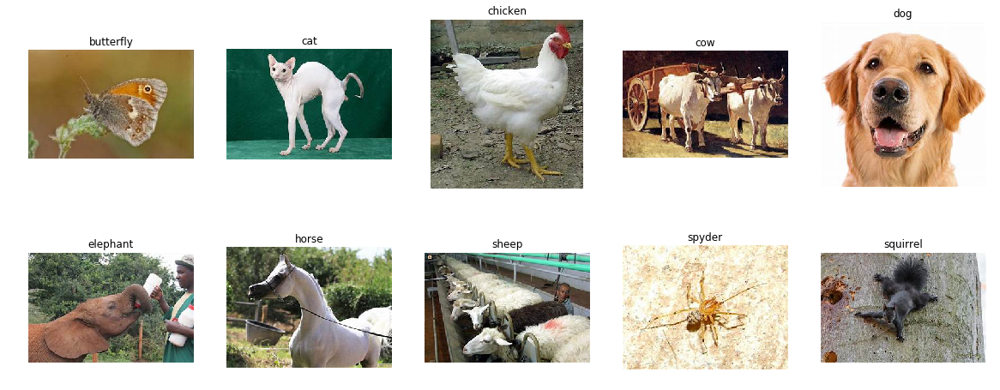

In [0]:
plot_df_images_c(df_full, 'path', 'category', 5)

## Image distribution by label

In [0]:
df_full.groupby('category')['path'].nunique()

category
butterfly    2464
cat          1941
chicken      3671
cow          2039
dog          4908
elephant     1483
horse        2672
sheep        1942
spyder       5133
squirrel     2013
Name: path, dtype: int64

Text(0.5, 1.0, 'All images distribution by category')

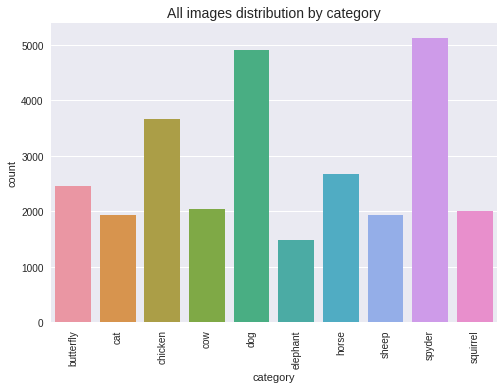

In [0]:
plt.style.use('seaborn')
sns.countplot(df_full['category'].sort_values(), data=df_full)
plt.xticks(rotation=90)
plt.title('All images distribution by category', fontsize=14)

## Image shape distribution

In [0]:
df_full.groupby('shape')['path'].nunique()

shape
(100, 200, 3)     1
(100, 300, 3)     5
(101, 300, 3)     2
(102, 300, 3)     1
(104, 120, 3)     1
(104, 300, 3)     2
(105, 140, 3)     1
(105, 300, 3)     2
(106, 300, 3)     2
(107, 160, 3)     1
(107, 300, 3)     4
(108, 152, 3)     1
(108, 300, 3)     2
(110, 300, 3)     2
(111, 102, 3)     1
(111, 300, 3)     6
(112, 300, 3)     1
(113, 120, 3)     1
(113, 300, 3)     3
(114, 300, 3)     8
(115, 256, 3)     1
(115, 300, 3)     4
(116, 300, 3)     1
(117, 300, 3)     2
(118, 300, 3)     2
(118, 69, 3)      1
(119, 137, 3)     1
(119, 300, 3)    17
(120, 118, 3)     1
(120, 120, 3)     1
                 ..
(640, 594, 3)     1
(640, 597, 3)     2
(640, 598, 3)     1
(640, 599, 3)     1
(640, 605, 3)     1
(640, 611, 3)     1
(640, 615, 3)     1
(640, 620, 3)     1
(640, 623, 3)     1
(640, 627, 3)     1
(640, 634, 3)     1
(640, 635, 3)     1
(640, 637, 3)     1
(640, 640, 3)    31
(640, 640, 4)     4
(71, 300, 3)      1
(73, 300, 3)      1
(75, 120, 3)      1
(75, 300, 3)  

In [0]:
df_full.groupby('shape')['path'].nunique().reset_index().sort_values(by='path', ascending=False).head()

,shape,path
356,"(225, 300, 3)",4750
259,"(200, 300, 3)",3489
694,"(300, 300, 3)",1396
139,"(169, 300, 3)",1130
814,"(426, 640, 3)",736


In [0]:
df_full.groupby('shape')['path'].nunique().reset_index().sort_values(by='path', ascending=False).tail(3)

,shape,path
419,"(249, 278, 3)",1
421,"(250, 249, 3)",1
1075,"(99, 300, 3)",1


# Image data preprocessing

In [0]:
IMG_DIMS = (90, 90, 3)

In [0]:
# We will use part of the data for modeling
train_data, valid_data, test_data = ImageDataset.split(
    dataset=ImageDataset.from_subfolders(DATA_DIR / "raw-img"),
    fracs=(0.4, 0.07, 0.07),
)

In [0]:
train_image_dataset = (
    train_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=True)
    .make_pipeline(
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=3, flips="both"),
        ],
    )
    .save_pipeline(TEMP_DIR/"train")
    .preprocess()
)

In [0]:
valid_image_dataset = (
    valid_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=False)
    .make_pipeline(
        label_map=train_image_dataset.label_map,
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
        ],
    )
    .save_pipeline(TEMP_DIR/"pred")
    .preprocess()
)

In [0]:
test_image_dataset = (
    test_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=False)
    .load_pipeline(TEMP_DIR/"pred")
    .preprocess()
)

In [20]:
train_image_dataset.label_map

{'butterfly': 0,
 'cat': 1,
 'chicken': 2,
 'cow': 3,
 'dog': 4,
 'elephant': 5,
 'horse': 6,
 'sheep': 7,
 'spyder': 8,
 'squirrel': 9}

In [21]:
test_image_dataset.label_map

{'butterfly': 0,
 'cat': 1,
 'chicken': 2,
 'cow': 3,
 'dog': 4,
 'elephant': 5,
 'horse': 6,
 'sheep': 7,
 'spyder': 8,
 'squirrel': 9}

In [22]:
[len(x) for x in (train_image_dataset, valid_image_dataset, test_image_dataset)]

[11307, 1979, 1979]

In [0]:
data_container = DataContainer(
    train=train_image_dataset,
    validation=valid_image_dataset,
    test=test_image_dataset,
)

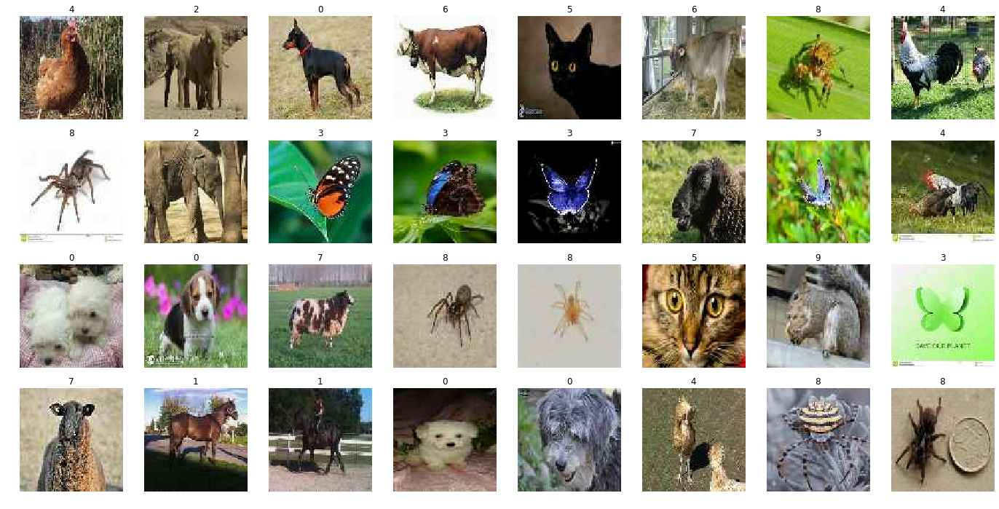

In [0]:
data_container.train.show()

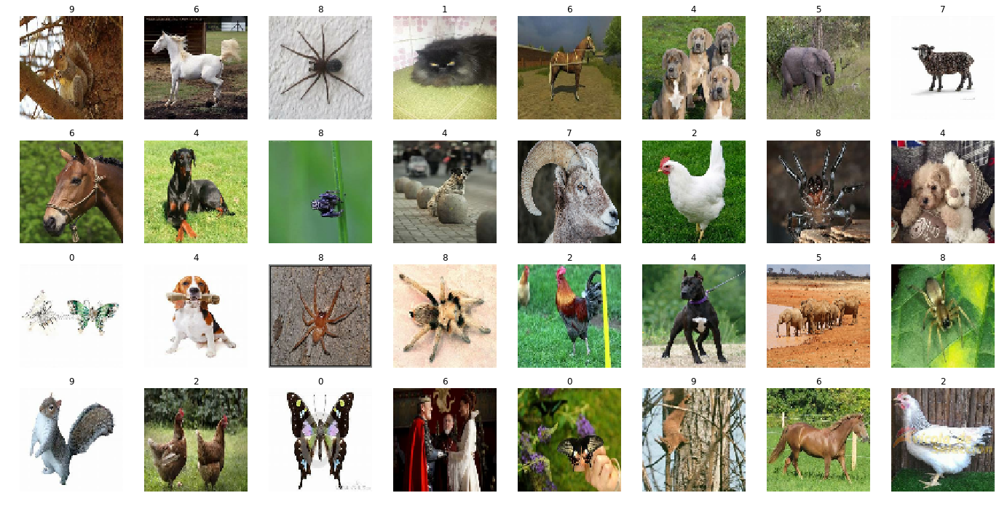

In [0]:
data_container.validation.show()

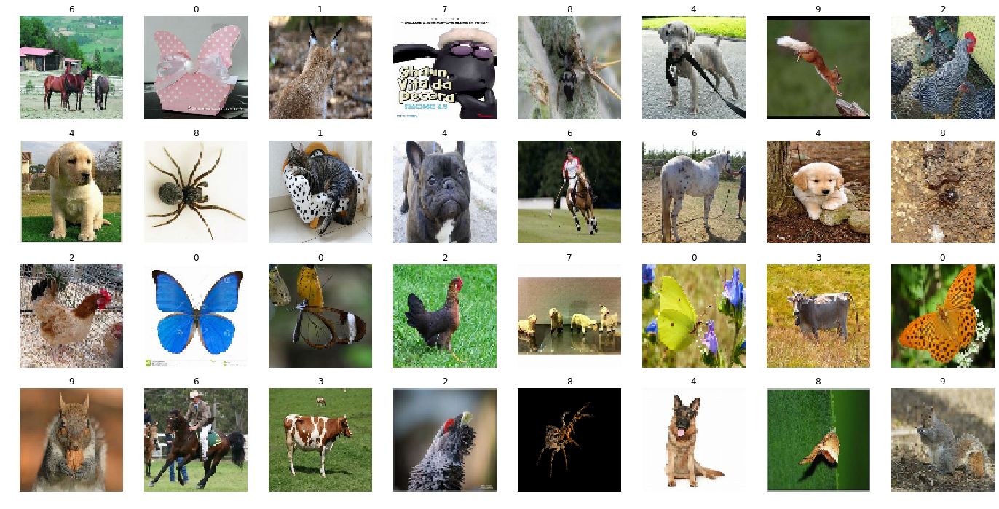

In [0]:
data_container.test.show()

# Modelling

## Model 1

```
IMG_DIMS = (90, 90, 3)
base_model = Xception
4 steps:
epochs = (1, 5, 5, 5)
lrs=(3e-4, 3e-5, 3e-5, 1e-5)
optimizer = Adam, Adam, Adam, SGD
dropout=0.5,
l1=3e-6,
l2=3e-5,
ImageResizer = "stretch"
```



In [0]:
learner = ImageLearner(
    path=TEMP_DIR/"xception_v3",
    base_model=keras.applications.Xception,
    input_shape=IMG_DIMS,
    output_shape=[data_container.train.n_classes],
    activation=keras.activations.softmax,
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=[keras.metrics.sparse_categorical_accuracy, sparse_top_2_categorical_accuracy],
    dropout=0.5,
    l1=3e-6,
    l2=3e-5,
    override=True,
)

In [0]:
steps = [
    ImageTrainingStep(
        n_epochs=1,
        lr=3e-4,
        optimizer=keras.optimizers.Adam,
        freeze=True,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=1),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=5, flips="both"),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=3, flips="both"),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=1e-5,
        optimizer=keras.optimizers.SGD,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=1),
        ],
    ),
]

In [0]:
trainer = ImageTrainer(
    learner=learner,
    data_container=data_container,
    steps=steps,
)

In [0]:
trainer.train()

Train for 354 steps, validate for 62 steps
354/354 [==============================] - 35s 99ms/step - loss: 1.8887 - sparse_categorical_accuracy: 0.3726 - sparse_top_2_categorical_accuracy: 0.5315 - val_loss: 1.0953 - val_sparse_categorical_accuracy: 0.6542 - val_sparse_top_2_categorical_accuracy: 0.8019
Train for 354 steps, validate for 62 steps
Epoch 1/5
354/354 [==============================] - 66s 188ms/step - loss: 1.8364 - sparse_categorical_accuracy: 0.4521 - sparse_top_2_categorical_accuracy: 0.6151 - val_loss: 0.9583 - val_sparse_categorical_accuracy: 0.7152 - val_sparse_top_2_categorical_accuracy: 0.8513
Epoch 2/5
354/354 [==============================] - 52s 147ms/step - loss: 1.3229 - sparse_categorical_accuracy: 0.5702 - sparse_top_2_categorical_accuracy: 0.7245 - val_loss: 0.7891 - val_sparse_categorical_accuracy: 0.7555 - val_sparse_top_2_categorical_accuracy: 0.8841
Epoch 3/5
354/354 [==============================] - 52s 147ms/step - loss: 1.1185 - sparse_categorical

In [0]:
trainer.evaluate_dataset()

62/62 [==============================] - 2s 39ms/step - loss: 0.5333 - sparse_categorical_accuracy: 0.8488 - sparse_top_2_categorical_accuracy: 0.9219


[0.533291878959825, 0.84879035, 0.921875]

## Model 2

```
IMG_DIMS = (90, 90, 3)
base_model = Xception
4 steps:
epochs = (1, 5, 5, 5)
lrs=(3e-4, 3e-5, 3e-5, 1e-5)
optimizer = Adam, Adam, Adam, SGD
dropout=0.5,
l1=3e-6,
l2=3e-5,
ImageResizer = "crop"
```



In [0]:
IMG_DIMS = (90, 90, 3)

In [0]:
train_image_dataset = (
    train_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=True)
    .make_pipeline(
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="crop"),
            ImageAugmentor(level=3, flips="both"),
        ],
    )
    .save_pipeline(TEMP_DIR/"train")
    .preprocess()
)

In [0]:
valid_image_dataset = (
    valid_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=False)
    .make_pipeline(
        label_map=train_image_dataset.label_map,
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="crop"),
        ],
    )
    .save_pipeline(TEMP_DIR/"pred")
    .preprocess()
)

In [0]:
test_image_dataset = (
    test_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=False)
    .load_pipeline(TEMP_DIR/"pred")
    .preprocess()
)

In [0]:
data_container = DataContainer(
    train=train_image_dataset,
    validation=valid_image_dataset,
    test=test_image_dataset,
)

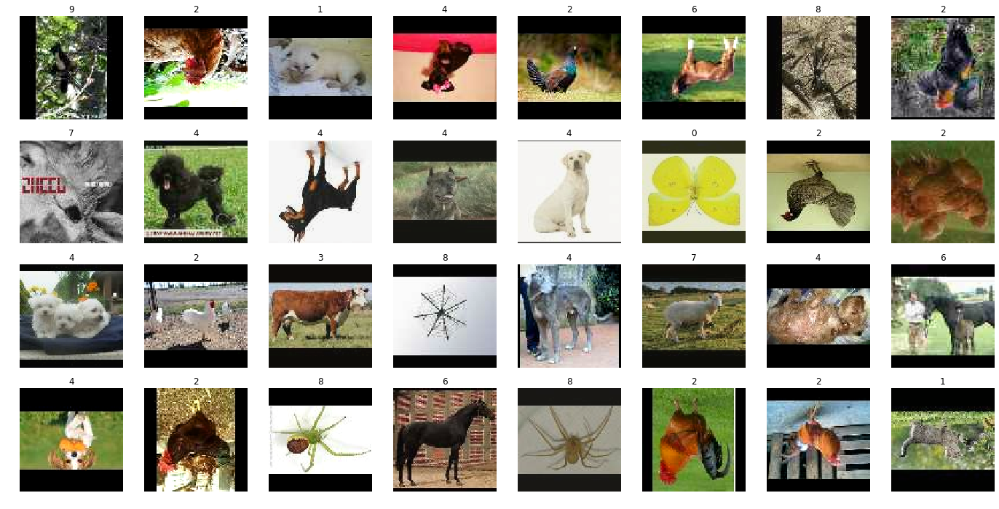

In [0]:
data_container.train.show()

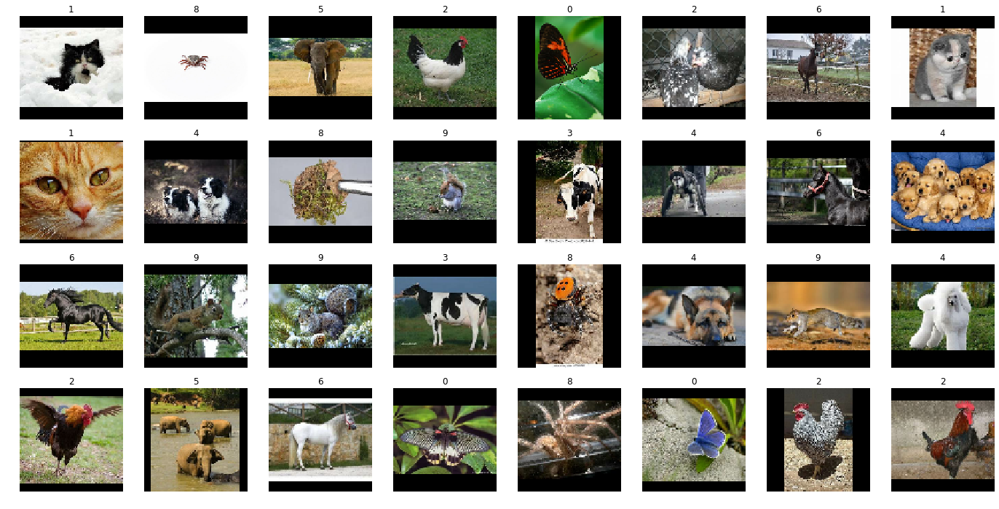

In [0]:
data_container.validation.show()

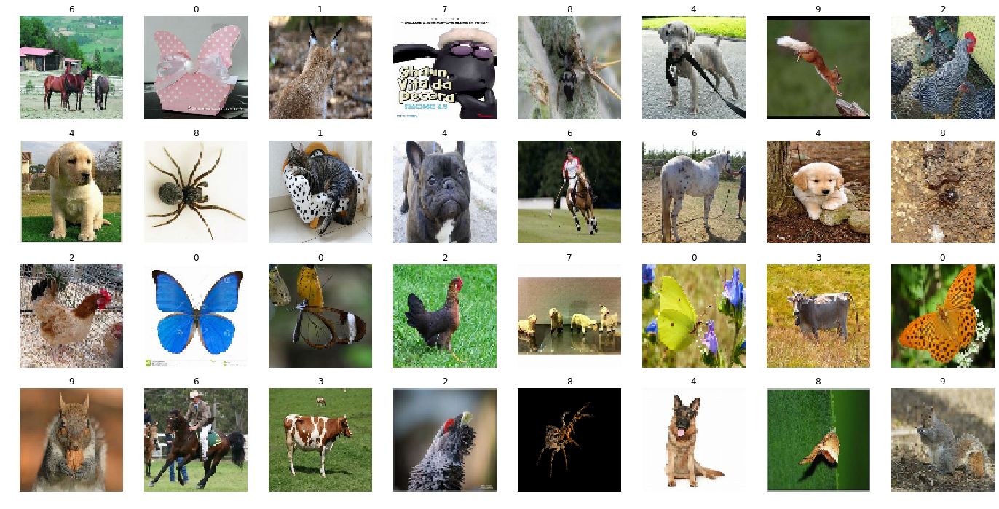

In [0]:
data_container.test.show()

In [0]:
learner_v7 = ImageLearner(
    path=TEMP_DIR/"xception_v7",
    base_model=keras.applications.Xception,
    input_shape=IMG_DIMS,
    output_shape=[data_container.train.n_classes],
    activation=keras.activations.softmax,
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=[keras.metrics.sparse_categorical_accuracy, sparse_top_2_categorical_accuracy],
    dropout=0.5,
    l1=3e-6,
    l2=3e-5,
    override=True,
)

In [0]:
steps = [
    ImageTrainingStep(
        n_epochs=1,
        lr=3e-4,
        optimizer=keras.optimizers.Adam,
        freeze=True,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="crop"),
            ImageAugmentor(level=1),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="crop"),
            ImageAugmentor(level=5, flips="both"),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="crop"),
            ImageAugmentor(level=3, flips="both"),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=1e-5,
        optimizer=keras.optimizers.SGD,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="crop"),
            ImageAugmentor(level=1),
        ],
    ),
]

In [0]:
trainer_v7 = ImageTrainer(
    learner=learner_v7,
    data_container=data_container,
    steps=steps,
)

In [0]:
trainer_v7.train()

Train for 354 steps, validate for 62 steps
354/354 [==============================] - 68s 191ms/step - loss: 2.0613 - sparse_categorical_accuracy: 0.2985 - sparse_top_2_categorical_accuracy: 0.4543 - val_loss: 1.5810 - val_sparse_categorical_accuracy: 0.4950 - val_sparse_top_2_categorical_accuracy: 0.6502
Train for 354 steps, validate for 62 steps
Epoch 1/5
354/354 [==============================] - 134s 377ms/step - loss: 2.1254 - sparse_categorical_accuracy: 0.3574 - sparse_top_2_categorical_accuracy: 0.5119 - val_loss: 1.3487 - val_sparse_categorical_accuracy: 0.6038 - val_sparse_top_2_categorical_accuracy: 0.7702
Epoch 2/5
354/354 [==============================] - 107s 303ms/step - loss: 1.5932 - sparse_categorical_accuracy: 0.4758 - sparse_top_2_categorical_accuracy: 0.6412 - val_loss: 1.0600 - val_sparse_categorical_accuracy: 0.6512 - val_sparse_top_2_categorical_accuracy: 0.8145
Epoch 3/5
354/354 [==============================] - 109s 307ms/step - loss: 1.3611 - sparse_categor

In [0]:
trainer_v7.evaluate_dataset()

62/62 [==============================] - 4s 71ms/step - loss: 0.6240 - sparse_categorical_accuracy: 0.7933 - sparse_top_2_categorical_accuracy: 0.9057


[0.62400070049109, 0.79334676, 0.905746]

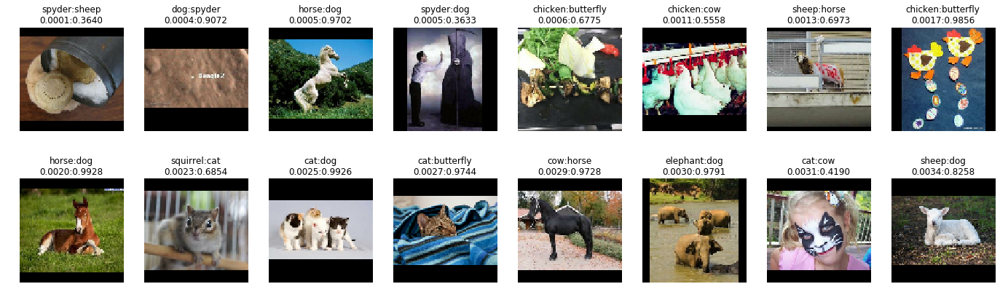

In [0]:
trainer_v7.show_predictions()

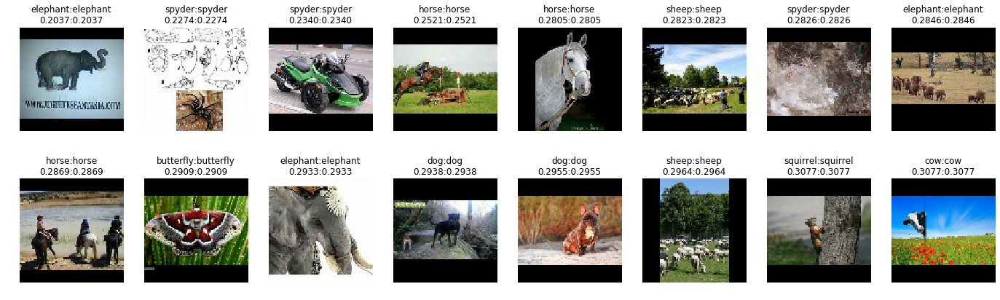

In [0]:
trainer_v7.show_predictions(correct=True)

## Model 3

```
IMG_DIMS = (90, 90, 3)
base_model = MobileNetV2
4 steps:
epochs = (1, 5, 5, 5)
lrs=(3e-4, 3e-5, 3e-5, 1e-5)
optimizer = Adam, Adam, Adam, SGD
dropout=0.5,
l1=3e-6,
l2=3e-5,
ImageResizer = "stretch"
```



In [0]:
learner_8 = ImageLearner(
    path=TEMP_DIR/"MobileNetV2_v8",
    base_model=keras.applications.MobileNetV2,
    input_shape=IMG_DIMS,
    output_shape=[data_container.train.n_classes],
    activation=keras.activations.softmax,
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=[keras.metrics.sparse_categorical_accuracy, sparse_top_2_categorical_accuracy],
    dropout=0.5,
    l1=3e-6,
    l2=3e-5,
    override=True,
)

In [0]:
steps = [
    ImageTrainingStep(
        n_epochs=1,
        lr=3e-4,
        optimizer=keras.optimizers.Adam,
        freeze=True,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=1),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=5, flips="both"),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=3, flips="both"),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=1e-5,
        optimizer=keras.optimizers.SGD,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=1),
        ],
    ),
]

In [0]:
trainer_8 = ImageTrainer(
    learner=learner_8,
    data_container=data_container,
    steps=steps,
)

In [0]:
trainer_8.train()

Train for 354 steps, validate for 62 steps
354/354 [==============================] - 47s 132ms/step - loss: 3.1282 - sparse_categorical_accuracy: 0.3216 - sparse_top_2_categorical_accuracy: 0.4854 - val_loss: 1.6880 - val_sparse_categorical_accuracy: 0.5912 - val_sparse_top_2_categorical_accuracy: 0.7581
Train for 354 steps, validate for 62 steps
Epoch 1/5
354/354 [==============================] - 68s 191ms/step - loss: 1.9775 - sparse_categorical_accuracy: 0.4296 - sparse_top_2_categorical_accuracy: 0.5945 - val_loss: 1.0605 - val_sparse_categorical_accuracy: 0.6986 - val_sparse_top_2_categorical_accuracy: 0.8362
Epoch 2/5
354/354 [==============================] - 43s 123ms/step - loss: 1.6323 - sparse_categorical_accuracy: 0.5131 - sparse_top_2_categorical_accuracy: 0.6797 - val_loss: 0.9529 - val_sparse_categorical_accuracy: 0.7414 - val_sparse_top_2_categorical_accuracy: 0.8594
Epoch 3/5
354/354 [==============================] - 43s 122ms/step - loss: 1.4819 - sparse_categorica

In [0]:
trainer_8.evaluate_dataset()

62/62 [==============================] - 3s 46ms/step - loss: 0.5599 - sparse_categorical_accuracy: 0.8196 - sparse_top_2_categorical_accuracy: 0.9239


[0.5598991179177838, 0.8195565, 0.9238911]

## Model 4

```
IMG_DIMS = (150, 150, 3)
base_model = Xception
4 steps:
epochs = (1, 5, 5, 5)
lrs=(3e-4, 3e-5, 3e-5, 1e-5)
optimizer = Adam, Adam, Adam, SGD
dropout=0.5,
l1=3e-6,
l2=3e-5,
ImageResizer = "stretch"
```



In [0]:
IMG_DIMS = (150, 150, 3)

In [0]:
train_image_dataset = (
    train_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=True)
    .make_pipeline(
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=3, flips="both"),
        ],
    )
    .save_pipeline(TEMP_DIR/"train")
    .preprocess()
)

In [0]:
valid_image_dataset = (
    valid_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=False)
    .make_pipeline(
        label_map=train_image_dataset.label_map,
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
        ],
    )
    .save_pipeline(TEMP_DIR/"pred")
    .preprocess()
)

In [0]:
test_image_dataset = (
    test_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=False)
    .load_pipeline(TEMP_DIR/"pred")
    .preprocess()
)

In [0]:
train_image_dataset.label_map

{'butterfly': 0,
 'cat': 1,
 'chicken': 2,
 'cow': 3,
 'dog': 4,
 'elephant': 5,
 'horse': 6,
 'sheep': 7,
 'spyder': 8,
 'squirrel': 9}

In [0]:
test_image_dataset.label_map

{'butterfly': 0,
 'cat': 1,
 'chicken': 2,
 'cow': 3,
 'dog': 4,
 'elephant': 5,
 'horse': 6,
 'sheep': 7,
 'spyder': 8,
 'squirrel': 9}

In [0]:
data_container = DataContainer(
    train=train_image_dataset,
    validation=valid_image_dataset,
    test=test_image_dataset,
)

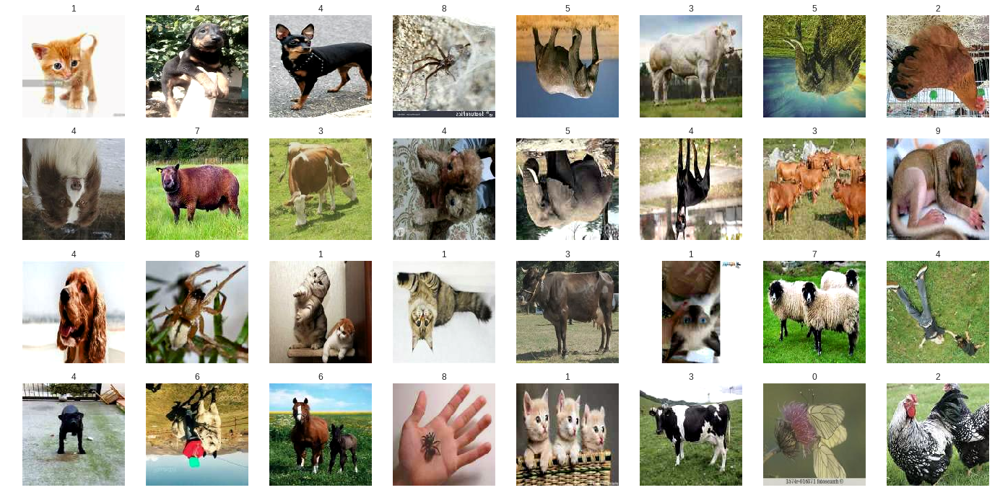

In [0]:
data_container.train.show()

In [0]:
learner = ImageLearner(
    path=TEMP_DIR/"xception_v4",
    base_model=keras.applications.Xception,
    input_shape=IMG_DIMS,
    output_shape=[data_container.train.n_classes],
    activation=keras.activations.softmax,
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=[keras.metrics.sparse_categorical_accuracy, sparse_top_2_categorical_accuracy],
    dropout=0.5,
    l1=3e-6,
    l2=3e-5,
    override=True,
)

In [0]:
steps = [
    ImageTrainingStep(
        n_epochs=1,
        lr=3e-4,
        optimizer=keras.optimizers.Adam,
        freeze=True,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=1),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=5, flips="both"),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=3, flips="both"),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=1e-5,
        optimizer=keras.optimizers.SGD,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=1),
        ],
    ),
]

In [0]:
trainer = ImageTrainer(
    learner=learner,
    data_container=data_container,
    steps=steps,
)

In [0]:
trainer.train()

Train for 354 steps, validate for 62 steps
354/354 [==============================] - 64s 180ms/step - loss: 1.2788 - sparse_categorical_accuracy: 0.5940 - sparse_top_2_categorical_accuracy: 0.7304 - val_loss: 0.4579 - val_sparse_categorical_accuracy: 0.8710 - val_sparse_top_2_categorical_accuracy: 0.9395
Train for 354 steps, validate for 62 steps
Epoch 1/5
354/354 [==============================] - 136s 383ms/step - loss: 1.2812 - sparse_categorical_accuracy: 0.6659 - sparse_top_2_categorical_accuracy: 0.7892 - val_loss: 0.4449 - val_sparse_categorical_accuracy: 0.8730 - val_sparse_top_2_categorical_accuracy: 0.9516
Epoch 2/5
354/354 [==============================] - 114s 322ms/step - loss: 0.8510 - sparse_categorical_accuracy: 0.7468 - sparse_top_2_categorical_accuracy: 0.8583 - val_loss: 0.4233 - val_sparse_categorical_accuracy: 0.8846 - val_sparse_top_2_categorical_accuracy: 0.9551
Epoch 3/5
354/354 [==============================] - 114s 321ms/step - loss: 0.6911 - sparse_categor

In [0]:
trainer.evaluate_dataset()

62/62 [==============================] - 4s 62ms/step - loss: 0.3076 - sparse_categorical_accuracy: 0.9199 - sparse_top_2_categorical_accuracy: 0.9672


[0.30756660242895445, 0.9198589, 0.9672379]

In [0]:
xception_v4_analyse_dataset = trainer.analyse_dataset()

In [0]:
xception_v4_analyse_dataset.to_csv(TEMP_DIR/'xception_v4/analyse_dataset_xception_v4.csv', index=False)

In [0]:
xception_v4_analyse_dataset = pd.read_csv(TEMP_DIR/'xception_v4/analyse_dataset_xception_v4.csv')

In [0]:
xception_v4_analyse_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1979 entries, 0 to 1978
Data columns (total 8 columns):
path           1979 non-null object
image          1979 non-null object
label          1979 non-null object
label_code     1979 non-null int64
pred           1979 non-null object
pred_code      1979 non-null int64
label_probs    1979 non-null float64
pred_probs     1979 non-null float64
dtypes: float64(2), int64(2), object(4)
memory usage: 123.8+ KB


In [0]:
xception_v4_analyse_dataset.head()

,path,image,label,label_code,pred,pred_code,label_probs,pred_probs
0,data/animals10/raw-img/spyder/OIP-9dWF8Tkm7n2L...,[[[0.8568628 0.754902 0.70392156]\n [0.841...,spyder,8,spyder,8,1.000000,1.000000
1,data/animals10/raw-img/dog/OIP-iSFBqUGd1QRZrwr...,[[[0.00849673 0.23594773 0.2908497 ]\n [0.011...,dog,4,dog,4,0.984812,0.984812
2,data/animals10/raw-img/cat/1195.jpeg,[[[0.6393137 0.42754906 0.24715687]\n [0.649...,cat,1,dog,4,0.353756,0.405858
3,data/animals10/raw-img/spyder/OIP-jt8fMknQxXwG...,[[[0.81568635 0.74509805 0.46274513]\n [0.819...,spyder,8,spyder,8,0.999997,0.999997
4,data/animals10/raw-img/spyder/OIP-l4vpow-iGcQT...,[[[0.6333333 0.70392156 0.5470588 ]\n [0.609...,spyder,8,spyder,8,0.954660,0.954660


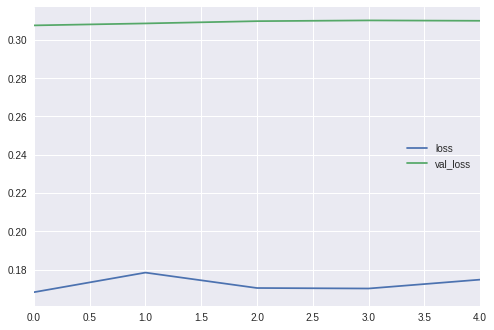

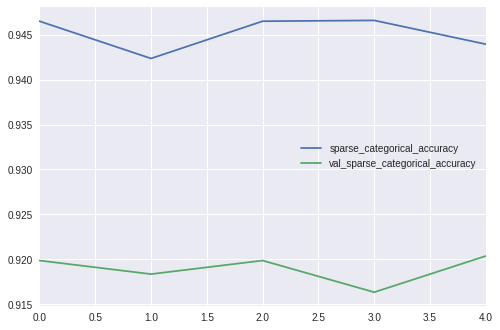

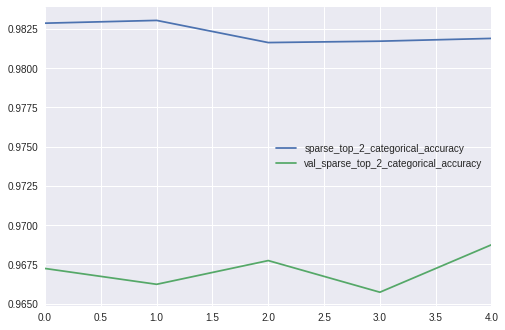

In [0]:
learner.show_history('loss')
learner.show_history('sparse_categorical_accuracy')
learner.show_history('sparse_top_2_categorical_accuracy')

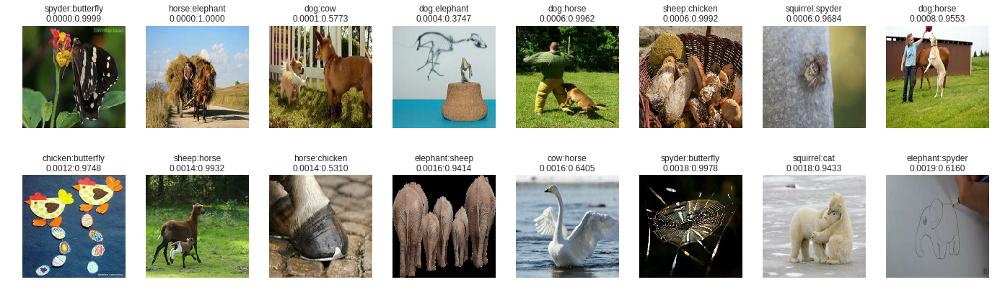

In [0]:
trainer.show_predictions()

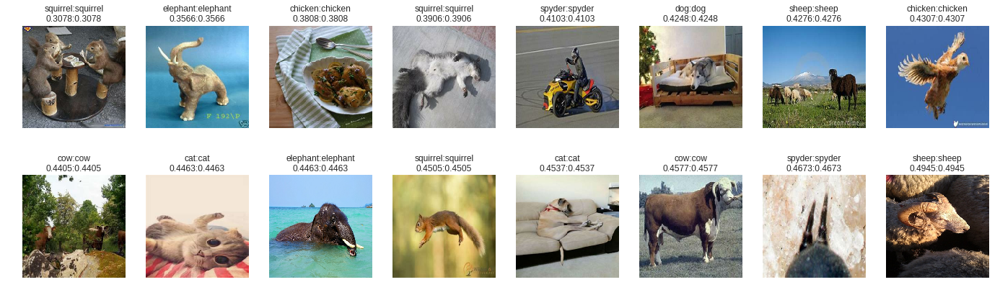

In [0]:
trainer.show_predictions(correct=True)

## Model 5

```
IMG_DIMS = (224, 224, 3)
base_model = Xception
4 steps:
epochs = (5, 5, 5, 5)
lrs=(3e-4, 3e-5, 3e-5, 1e-5)
optimizer = Adam, Adam, Adam, Adam
dropout=0.5,
l1=3e-6,
l2=3e-5,
ImageResizer = "stretch"
```



In [0]:
IMG_DIMS = (224, 224, 3)

In [0]:
train_image_dataset = (
    train_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=True)
    .make_pipeline(
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=3, flips="both"),
        ],
    )
    .save_pipeline(TEMP_DIR/"train")
    .preprocess()
)

In [0]:
valid_image_dataset = (
    valid_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=False)
    .make_pipeline(
        label_map=train_image_dataset.label_map,
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
        ],
    )
    .save_pipeline(TEMP_DIR/"pred")
    .preprocess()
)

In [0]:
test_image_dataset = (
    test_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=False)
    .load_pipeline(TEMP_DIR/"pred")
    .preprocess()
)

In [0]:
data_container = DataContainer(
    train=train_image_dataset,
    validation=valid_image_dataset,
    test=test_image_dataset,
)

In [0]:
data_container.train.show()

In [0]:
learner_v5 = ImageLearner(
    path=TEMP_DIR/"xception_v5",
    base_model=keras.applications.Xception,
    input_shape=IMG_DIMS,
    output_shape=[data_container.train.n_classes],
    activation=keras.activations.softmax,
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=[keras.metrics.sparse_categorical_accuracy, sparse_top_2_categorical_accuracy],
    dropout=0.5,
    l1=3e-6,
    l2=3e-5,
    override=True,
)

In [0]:
steps = [
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-4,
        optimizer=keras.optimizers.Adam,
        freeze=True,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=1),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=3, flips="both"),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=5, flips="both"),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=1e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=1),
        ],
    ),
]

In [0]:
trainer_v5 = ImageTrainer(
    learner=learner_v5,
    data_container=data_container,
    steps=steps,
)

In [0]:
trainer_v5.train()

Train for 354 steps, validate for 62 steps
Epoch 1/5
354/354 [==============================] - 203s 575ms/step - loss: 0.8549 - sparse_categorical_accuracy: 0.7413 - sparse_top_2_categorical_accuracy: 0.8376 - val_loss: 0.2179 - val_sparse_categorical_accuracy: 0.9345 - val_sparse_top_2_categorical_accuracy: 0.9688
Epoch 2/5
354/354 [==============================] - 172s 486ms/step - loss: 0.4065 - sparse_categorical_accuracy: 0.8822 - sparse_top_2_categorical_accuracy: 0.9400 - val_loss: 0.2201 - val_sparse_categorical_accuracy: 0.9405 - val_sparse_top_2_categorical_accuracy: 0.9753
Epoch 3/5
354/354 [==============================] - 173s 488ms/step - loss: 0.3676 - sparse_categorical_accuracy: 0.8898 - sparse_top_2_categorical_accuracy: 0.9459 - val_loss: 0.2157 - val_sparse_categorical_accuracy: 0.9410 - val_sparse_top_2_categorical_accuracy: 0.9738
Epoch 4/5
354/354 [==============================] - 170s 479ms/step - loss: 0.3317 - sparse_categorical_accuracy: 0.9019 - sparse_t

In [0]:
trainer_v5.evaluate_dataset()

62/62 [==============================] - 20s 324ms/step - loss: 0.1821 - sparse_categorical_accuracy: 0.9531 - sparse_top_2_categorical_accuracy: 0.9793


[0.18205203335251538, 0.953125, 0.97933465]

In [0]:
xception_v5_analyse_dataset = trainer_v5.analyse_dataset()
xception_v5_analyse_dataset.to_csv(TEMP_DIR/'xception_v5/analyse_dataset_xception_v5.csv', index=False)
xception_v5_analyse_dataset = pd.read_csv(TEMP_DIR/'xception_v5/analyse_dataset_xception_v5.csv')

In [0]:
xception_v5_analyse_dataset.head()

,path,image,label,label_code,pred,pred_code,label_probs,pred_probs
0,data/animals10/raw-img/cat/1286.jpeg,[[[0.9978992 0.9978992 0.9978992 ]\n [0.982...,cat,1,cat,1,0.999991,0.999991
1,data/animals10/raw-img/spyder/ea36b60f21f7003e...,[[[1. 1. 1.]\n [1. 1. 1.]\n [1. 1. 1.]\n .....,spyder,8,spyder,8,1.000000,1.000000
2,data/animals10/raw-img/elephant/OIP-AIHBjXeB35...,[[[0.21568629 0.3529412 0.36078432]\n [0.215...,elephant,5,elephant,5,1.000000,1.000000
3,data/animals10/raw-img/chicken/OIP-XWSJ78EoxeA...,[[[0.23131692 0.36072868 0.17643245]\n [0.176...,chicken,2,chicken,2,1.000000,1.000000
4,data/animals10/raw-img/butterfly/ea37b80b2ff40...,[[[0.13333334 0.4156863 0.12941177]\n [0.129...,butterfly,0,butterfly,0,1.000000,1.000000


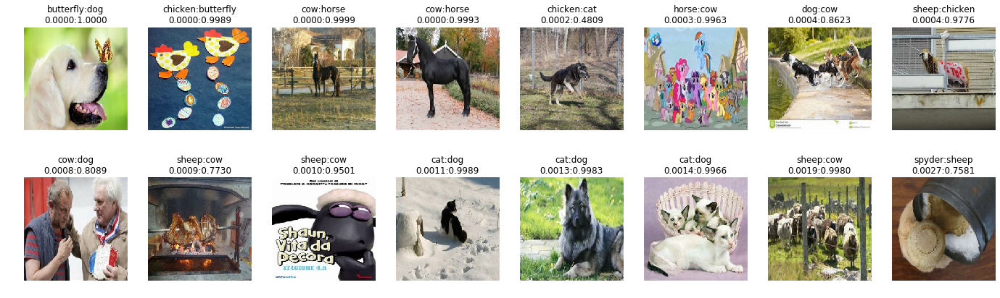

In [0]:
trainer_v5.show_predictions()

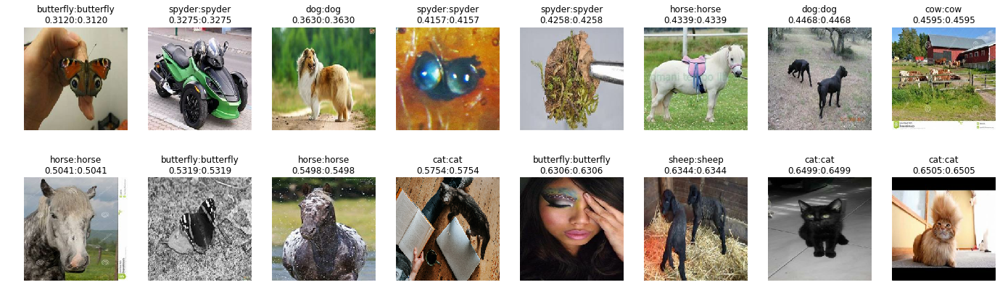

In [0]:
trainer_v5.show_predictions(correct=True)

In [0]:
print(classification_report(xception_v5_analyse_dataset.label_code, xception_v5_analyse_dataset.pred_code))

              precision    recall  f1-score   support

           0       0.98      0.94      0.96       180
           1       0.95      0.94      0.94       126
           2       0.97      0.97      0.97       234
           3       0.91      0.91      0.91       152
           4       0.93      0.97      0.95       360
           5       0.98      0.97      0.98       109
           6       0.96      0.93      0.95       196
           7       0.90      0.90      0.90       124
           8       0.97      0.99      0.98       353
           9       0.97      0.93      0.95       145

    accuracy                           0.95      1979
   macro avg       0.95      0.95      0.95      1979
weighted avg       0.95      0.95      0.95      1979



## Model 6

```
steps 1-3 IMG_DIMS = (99, 99, 3)
steps 4-5 IMG_DIMS = (224, 224, 3)
base_model = Xception
5 steps:
epochs = (5, 5, 3, 5, 5)
lrs=(3e-4, 1e-4, 3e-5, 1e-5)
optimizer = Adam, Adam, Adam, Adam, SGD
dropout=0.5,
l1=3e-6,
l2=3e-5,
ImageResizer = "stretch"
```



In [0]:
IMG_DIMS = (224, 224, 3)

In [0]:
train_image_dataset = (
    train_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=True)
    .make_pipeline(
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=3, flips="both"),
        ],
    )
    .save_pipeline(TEMP_DIR/"train")
    .preprocess()
)

In [0]:
valid_image_dataset = (
    valid_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=False)
    .make_pipeline(
        label_map=train_image_dataset.label_map,
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
        ],
    )
    .save_pipeline(TEMP_DIR/"pred")
    .preprocess()
)

In [0]:
test_image_dataset = (
    test_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=False)
    .load_pipeline(TEMP_DIR/"pred")
    .preprocess()
)

In [0]:
data_container = DataContainer(
    train=train_image_dataset,
    validation=valid_image_dataset,
    test=test_image_dataset,
)

In [0]:
learner_v6 = ImageLearner(
    path=TEMP_DIR/"xception_v6",
    base_model=keras.applications.Xception,
    input_shape=IMG_DIMS,
    output_shape=[data_container.train.n_classes],
    activation=keras.activations.softmax,
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=[keras.metrics.sparse_categorical_accuracy, sparse_top_2_categorical_accuracy],
    dropout=0.5,
    l1=3e-6,
    l2=3e-5,
    override=True,
)

In [0]:
steps = [
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-4,
        optimizer=keras.optimizers.Adam,
        freeze=True,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=(99, 99, 3), resize="stretch"),
            ImageAugmentor(level=1),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=1e-4,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=(99, 99, 3), resize="stretch"),
            ImageAugmentor(level=3, flips="both"),

        ],
    ),
    ImageTrainingStep(
        n_epochs=3,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=(99, 99, 3), resize="stretch"),
            ImageAugmentor(level=5),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=2, flips="both"),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.SGD,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
        ],
    ),
]

In [0]:
trainer_v6 = ImageTrainer(
    learner=learner_v6,
    data_container=data_container,
    steps=steps,
)

In [0]:
trainer_v6.train()

Train for 354 steps, validate for 62 steps
Epoch 1/5
354/354 [==============================] - 86s 244ms/step - loss: 1.8645 - sparse_categorical_accuracy: 0.3833 - sparse_top_2_categorical_accuracy: 0.5472 - val_loss: 0.5980 - val_sparse_categorical_accuracy: 0.8115 - val_sparse_top_2_categorical_accuracy: 0.9148
Epoch 2/5
354/354 [==============================] - 64s 180ms/step - loss: 1.4919 - sparse_categorical_accuracy: 0.5369 - sparse_top_2_categorical_accuracy: 0.6984 - val_loss: 0.5047 - val_sparse_categorical_accuracy: 0.8503 - val_sparse_top_2_categorical_accuracy: 0.9309
Epoch 3/5
354/354 [==============================] - 62s 176ms/step - loss: 1.3729 - sparse_categorical_accuracy: 0.5773 - sparse_top_2_categorical_accuracy: 0.7383 - val_loss: 0.5968 - val_sparse_categorical_accuracy: 0.8322 - val_sparse_top_2_categorical_accuracy: 0.9289
Epoch 4/5
354/354 [==============================] - 62s 175ms/step - loss: 1.3091 - sparse_categorical_accuracy: 0.6010 - sparse_top_2

In [0]:
# --------------------------------------------------------------------------------
# Name: xception Train Time: 110.8 min. Eval Time: 21.28s Loss: 0.1453 Accuracy: 95.77%
# --------------------------------------------------------------------------------

## Model 7

```
USING ALL DATASET
steps 1-2 IMG_DIMS = (99, 99, 3)
steps 3-4 IMG_DIMS = (224, 224, 3)
base_model = Xception
4 steps:
epochs = (5, 5, 5, 5)
lrs=(3e-4, 1e-4, 3e-5, 3e-5)
optimizer = Adam, Adam, Adam, Adam
dropout=0.5,
l1=3e-6,
l2=3e-5,
ImageResizer = "stretch"
```



In [0]:
# We will use All Images for modeling
train_data, valid_data, test_data = ImageDataset.split(
    dataset=ImageDataset.from_subfolders(DATA_DIR / "raw-img"),
    fracs=(0.8, 0.1, 0.1),
)

In [0]:
IMG_DIMS = (224, 224, 3)

In [0]:
train_image_dataset = (
    train_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=True)
    .make_pipeline(
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=3, flips="both"),
        ],
    )
    .save_pipeline(TEMP_DIR/"train")
    .preprocess()
)

In [0]:
valid_image_dataset = (
    valid_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=False)
    .make_pipeline(
        label_map=train_image_dataset.label_map,
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
        ],
    )
    .save_pipeline(TEMP_DIR/"pred")
    .preprocess()
)

In [0]:
test_image_dataset = (
    test_data
    .dataset(batch_size=32, img_dims=IMG_DIMS, shuffle=False)
    .load_pipeline(TEMP_DIR/"pred")
    .preprocess()
)

In [33]:
train_image_dataset.label_map

{'butterfly': 0,
 'cat': 1,
 'chicken': 2,
 'cow': 3,
 'dog': 4,
 'elephant': 5,
 'horse': 6,
 'sheep': 7,
 'spyder': 8,
 'squirrel': 9}

In [34]:
test_image_dataset.label_map

{'butterfly': 0,
 'cat': 1,
 'chicken': 2,
 'cow': 3,
 'dog': 4,
 'elephant': 5,
 'horse': 6,
 'sheep': 7,
 'spyder': 8,
 'squirrel': 9}

In [35]:
[len(x) for x in (train_image_dataset, valid_image_dataset, test_image_dataset)]

[22613, 2827, 2826]

In [0]:
data_container = DataContainer(
    train=train_image_dataset,
    validation=valid_image_dataset,
    test=test_image_dataset,
)

In [0]:
data_container.train.show()

In [0]:
data_container.validation.show()

In [0]:
data_container.test.show()

In [0]:
learner_v8 = ImageLearner(
    path=TEMP_DIR/"xception_v8",
    base_model=keras.applications.Xception,
    input_shape=IMG_DIMS,
    output_shape=[data_container.train.n_classes],
    activation=keras.activations.softmax,
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=[keras.metrics.sparse_categorical_accuracy, sparse_top_2_categorical_accuracy],
    dropout=0.5,
    l1=3e-6,
    l2=3e-5,
    override=True,
)

In [0]:
steps = [
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-4,
        optimizer=keras.optimizers.Adam,
        freeze=True,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=(99, 99, 3), resize="stretch"),
            ImageAugmentor(level=1),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=1e-4,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=(99, 99, 3), resize="stretch"),
            ImageAugmentor(level=3, flips="both"),

        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=5),
        ],
    ),
    ImageTrainingStep(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=2, flips="both"),
        ],
    ),
]

In [0]:
trainer_v8 = ImageTrainer(
    learner=learner_v8,
    data_container=data_container,
    steps=steps,
)

In [0]:
trainer_v8.train()

Train for 707 steps, validate for 89 steps
Epoch 1/5
707/707 [==============================] - 151s 213ms/step - loss: 1.6921 - sparse_categorical_accuracy: 0.4562 - sparse_top_2_categorical_accuracy: 0.6165 - val_loss: 0.4336 - val_sparse_categorical_accuracy: 0.8796 - val_sparse_top_2_categorical_accuracy: 0.9452
Epoch 2/5
707/707 [==============================] - 113s 159ms/step - loss: 1.3621 - sparse_categorical_accuracy: 0.5814 - sparse_top_2_categorical_accuracy: 0.7426 - val_loss: 0.4362 - val_sparse_categorical_accuracy: 0.8855 - val_sparse_top_2_categorical_accuracy: 0.9463
Epoch 3/5
707/707 [==============================] - 117s 166ms/step - loss: 1.2954 - sparse_categorical_accuracy: 0.5970 - sparse_top_2_categorical_accuracy: 0.7564 - val_loss: 0.4281 - val_sparse_categorical_accuracy: 0.8978 - val_sparse_top_2_categorical_accuracy: 0.9480
Epoch 4/5
707/707 [==============================] - 115s 163ms/step - loss: 1.2552 - sparse_categorical_accuracy: 0.6113 - sparse_t

In [0]:
trainer_v8.evaluate_dataset()

89/89 [==============================] - 30s 337ms/step - loss: 0.1247 - sparse_categorical_accuracy: 0.9673 - sparse_top_2_categorical_accuracy: 0.9863


[0.1247217505333129, 0.9673455, 0.9863062]

In [0]:
trainer_v8.evaluate_dataset(mode="test")

89/89 [==============================] - 30s 337ms/step - loss: 0.1390 - sparse_categorical_accuracy: 0.9642 - sparse_top_2_categorical_accuracy: 0.9863


[0.13902936925002363, 0.9641854, 0.9863062]

In [0]:
xception_v8_analyse_dataset = trainer_v8.analyse_dataset()
xception_v8_analyse_dataset.to_csv(TEMP_DIR/'xception_v8/analyse_dataset_xception_v8.csv', index=False)
xception_v8_analyse_dataset = pd.read_csv(TEMP_DIR/'xception_v8/analyse_dataset_xception_v8.csv')

In [0]:
xception_v8_analyse_test_dataset = trainer_v8.analyse_dataset(mode='test')
xception_v8_analyse_test_dataset.to_csv(TEMP_DIR/'xception_v8/analyse_tets_dataset_xception_v8.csv', index=False)
xception_v8_analyse_test_dataset = pd.read_csv(TEMP_DIR/'xception_v8/analyse_tets_dataset_xception_v8.csv')

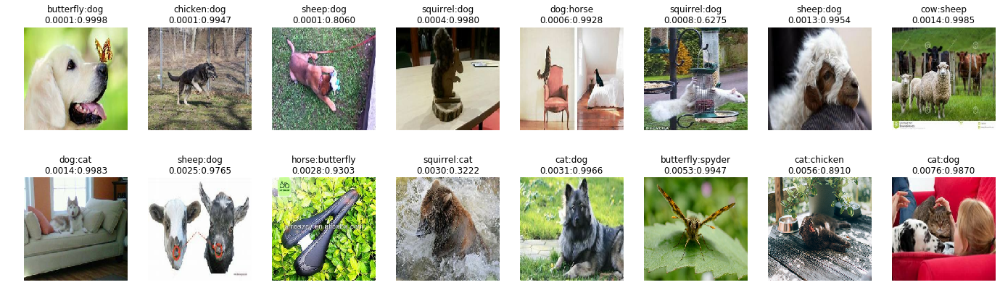

In [0]:
trainer_v8.show_predictions()

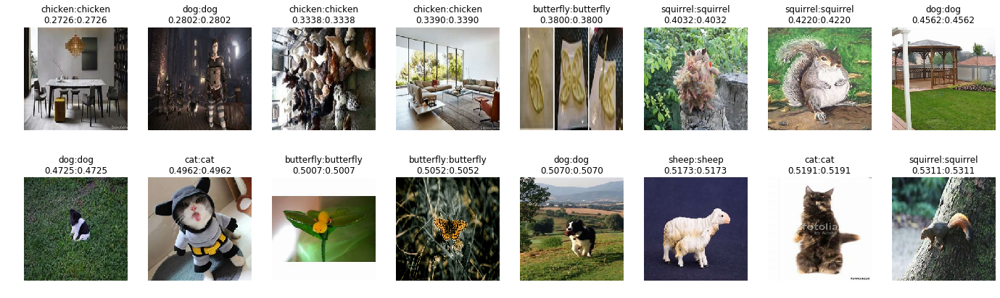

In [0]:
trainer_v8.show_predictions(correct=True)

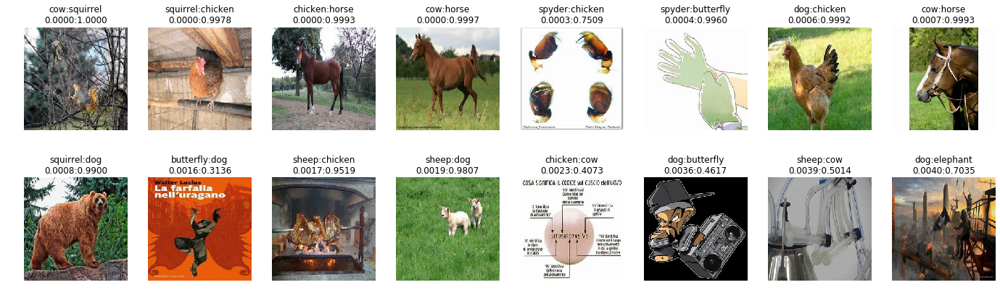

In [0]:
trainer_v8.show_predictions(mode='test')

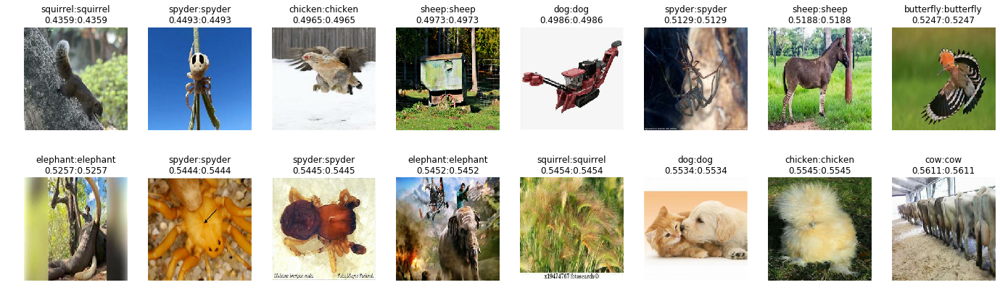

In [0]:
trainer_v8.show_predictions(mode='test', correct=True)

In [0]:
print(classification_report(xception_v8_analyse_dataset.label_code, xception_v8_analyse_dataset.pred_code))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       253
           1       0.96      0.95      0.96       184
           2       0.97      0.98      0.97       366
           3       0.95      0.97      0.96       210
           4       0.95      0.98      0.96       486
           5       0.99      0.99      0.99       163
           6       0.97      0.98      0.97       255
           7       0.98      0.92      0.95       215
           8       0.98      0.98      0.98       499
           9       0.96      0.93      0.94       196

    accuracy                           0.97      2827
   macro avg       0.97      0.96      0.97      2827
weighted avg       0.97      0.97      0.97      2827



In [0]:
print(classification_report(xception_v8_analyse_test_dataset.label_code, xception_v8_analyse_test_dataset.pred_code))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97       259
           1       0.97      0.97      0.97       189
           2       0.96      0.98      0.97       371
           3       0.92      0.95      0.93       219
           4       0.95      0.97      0.96       490
           5       0.98      0.99      0.99       141
           6       0.95      0.97      0.96       262
           7       0.98      0.91      0.94       196
           8       0.99      0.97      0.98       517
           9       0.99      0.92      0.96       182

    accuracy                           0.96      2826
   macro avg       0.96      0.96      0.96      2826
weighted avg       0.96      0.96      0.96      2826



# Summary